In [ ]:
from ydata_profiling import ProfileReport, compare
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.figure_factory as ff

%matplotlib inline

In [ ]:
df = pd.read_parquet(r"C:\projects\quick_pp\notebooks\data\SPAT_CLEAN_1eb901.parquet")

In [ ]:
profiles = ProfileReport(df, title="Profiling Report")

## Overall Profiling Report

In [ ]:
profiles.to_file(r"C:\projects\quick_pp\notebooks\outputs\SPAT_CLEAN_1eb901.html")

## Individual Well Profiling Report

In [ ]:
for well_name, well in df[['WELL_NAME', 'GR', 'RT', 'NPHI', 'RHOB']].groupby("WELL_NAME"):
    profile = ProfileReport(well.drop(columns=['WELL_NAME']), title=f"{well_name} Profiling Report",
                            explorative=True)
    profile.to_file(rf"C:\projects\quick_pp\notebooks\outputs\{well_name}_profiling_report.html")

## Compare selected wells with the rest of the wells

In [ ]:
well_name = "SPAT-A010"
well = df[df["WELL_NAME"] == well_name][['GR', 'RT', 'NPHI', 'RHOB']]
profile = ProfileReport(well, title=f"{well_name} Profiling Report", explorative=True)

others = df[df["WELL_NAME"] != well_name][['GR', 'RT', 'NPHI', 'RHOB']]
other_profiles = ProfileReport(others, title=f"Other Wells Profiling Report", explorative=True)

compare([profile, other_profiles]).to_file(rf"C:\projects\quick_pp\notebooks\outputs\{well_name}_compare.html")

## Compare distribution of selected variables by wells

In [29]:
vars = ['GR', 'NPHI', 'RHOB']
well_names = df.WELL_NAME.unique()
bins = {
    'GR': 1,
    'RT': 1,
    'NPHI': 0.005,
    'RHOB': 0.01

}
for var in vars:
    hist_data = [df[df["WELL_NAME"] == well_name][var] for well_name in well_names]
    fig = ff.create_distplot(hist_data, well_names, show_rug=False, show_curve=False,
                             bin_size=bins[var], histnorm='probability density')
    fig.show()

c:\projects\quick_pp\venv310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\projects\quick_pp\venv310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\projects\quick_pp\venv310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\projects\quick_pp\venv310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\projects\quick_pp\venv310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed 

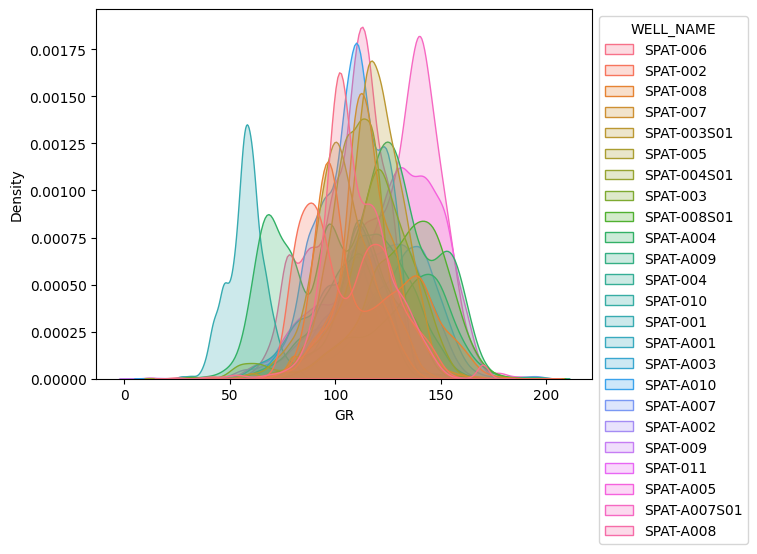

c:\projects\quick_pp\venv310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\projects\quick_pp\venv310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\projects\quick_pp\venv310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\projects\quick_pp\venv310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\projects\quick_pp\venv310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed 

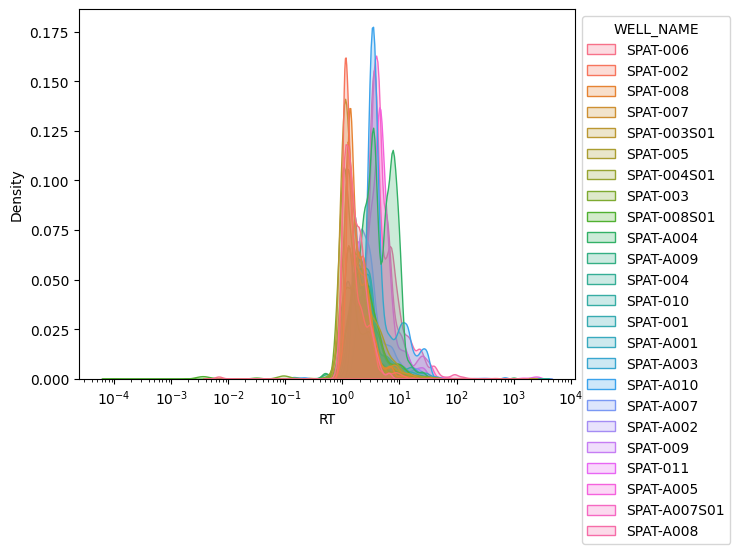

c:\projects\quick_pp\venv310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\projects\quick_pp\venv310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\projects\quick_pp\venv310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\projects\quick_pp\venv310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\projects\quick_pp\venv310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed 

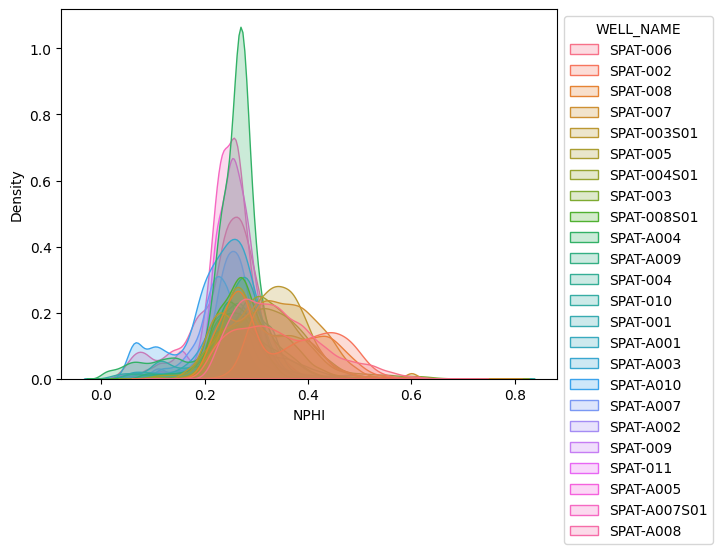

c:\projects\quick_pp\venv310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\projects\quick_pp\venv310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\projects\quick_pp\venv310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\projects\quick_pp\venv310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\projects\quick_pp\venv310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed 

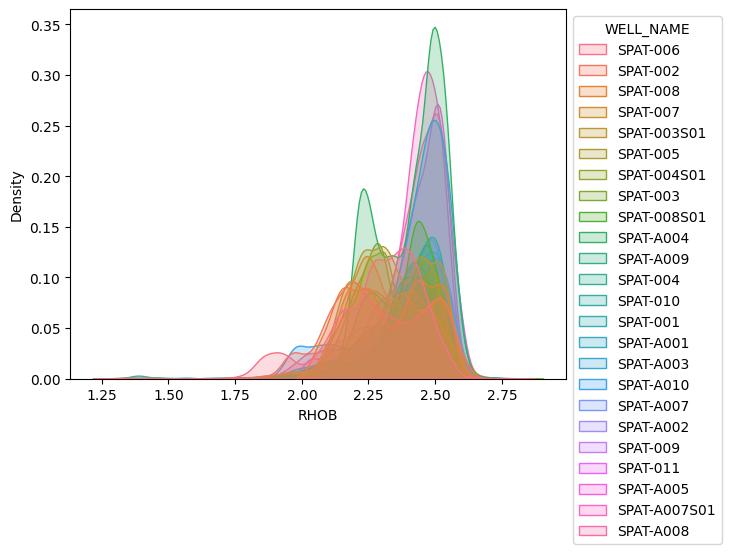

In [28]:
for var in ['GR', 'RT', 'NPHI', 'RHOB']:
    sns.kdeplot(data=df, x=var, hue='WELL_NAME', log_scale=True if var == 'RT' else False, fill=True, legend=True)
    sns.move_legend(plt.gca(), "upper left", bbox_to_anchor=(1, 1))
    plt.show()